# **Setup**

In [1]:
import os
import sys
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import tensorflow as tf
import tf_keras as tfk
import numpy as np
import tensorflow as tf
import json

from tensorflow_hub import KerasLayer

from tf_keras.preprocessing import image
from tf_keras.applications.imagenet_utils import preprocess_input
from tf_keras.preprocessing.image import ImageDataGenerator

2024-08-18 03:23:58.438344: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-18 03:23:58.438455: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-18 03:23:58.564849: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [55]:
!tar -zcvf vit.tar.gz /kaggle/working/vit_model_plankton

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


tar: Removing leading `/' from member names
/kaggle/working/vit_model_plankton/
/kaggle/working/vit_model_plankton/variables/
/kaggle/working/vit_model_plankton/variables/variables.data-00000-of-00001
/kaggle/working/vit_model_plankton/variables/variables.index
/kaggle/working/vit_model_plankton/saved_model.pb
/kaggle/working/vit_model_plankton/keras_metadata.pb
/kaggle/working/vit_model_plankton/fingerprint.pb
/kaggle/working/vit_model_plankton/assets/


In [54]:
file_path = '/kaggle/working/vit.tar.gz'

if os.path.exists(file_path):
    os.remove(file_path)
    print(f'File {file_path} berhasil dihapus.')
else:
    print(f'File {file_path} tidak ditemukan.')

File /kaggle/working/vit.tar.gz berhasil dihapus.


# **Dataset**

In [38]:
PATH = "/kaggle/input/image-classification-pythoplankton-dataset/classification/training_validation"
TEST = "/kaggle/input/image-classification-pythoplankton-dataset/classification/testing"
IMG_WIDTH = 224
IMG_HEIGHT = 224
BATCH_SIZE = 64

## **Load Image**

In [4]:
datagen = ImageDataGenerator(
    rescale=1/255,
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    fill_mode='nearest',
    validation_split=0.2
)

train_generator = datagen.flow_from_directory(
    PATH, target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    subset='training'
)

val_generator = datagen.flow_from_directory(
    PATH, target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)

Found 460 images belonging to 26 classes.
Found 100 images belonging to 26 classes.


In [40]:
test_datagen = ImageDataGenerator(
    rescale=1/255
)

test_generator = test_datagen.flow_from_directory(
    TEST, target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
)

Found 92 images belonging to 26 classes.


In [41]:
print(train_generator.batch_size)
print(val_generator.batch_size)
print(test_generator.batch_size)

64
64
64


In [16]:
dict_labels = {value: key for key, value in train_generator.class_indices.items()}

print("Label Mappings for classes present in the training and validation datasets\n")
for key, value in dict_labels.items():
    print(f"{key} : {value}")

Label Mappings for classes present in the training and validation datasets

0 : Achnanthes sp
1 : Bacteriastrum delicatulum
2 : Bleakeleya notata
3 : Chaetoceros affinis
4 : Chaetoceros diversus
5 : Chaetoceros peruvianus
6 : Coscinodiscus oculus-iridis
7 : Diatom
8 : Guinardia flaccida
9 : Hemiaulus hauckii
10 : Hemiaulus membranaceus
11 : Mastogloia sp
12 : Nitzschia
13 : Nitzschia longissima
14 : Plagiotropis lepidoptera
15 : Pleurosigma
16 : Proboscia alata
17 : Proboscia indica
18 : Pseudo-nitzschia spp
19 : Pseudosolenia calcar-avis
20 : Rhizosolenia calcar-avis
21 : Rhizosolenia cochlea
22 : Rhizosolenia imbricata
23 : Tetramphora (Amphora) decussata
24 : Thalassionema nitzschioides
25 : Toxarium undulatum


In [17]:
with open('labels.json', 'w') as label_file:
    json.dump(dict_labels, label_file)

## **Plot Several Image**

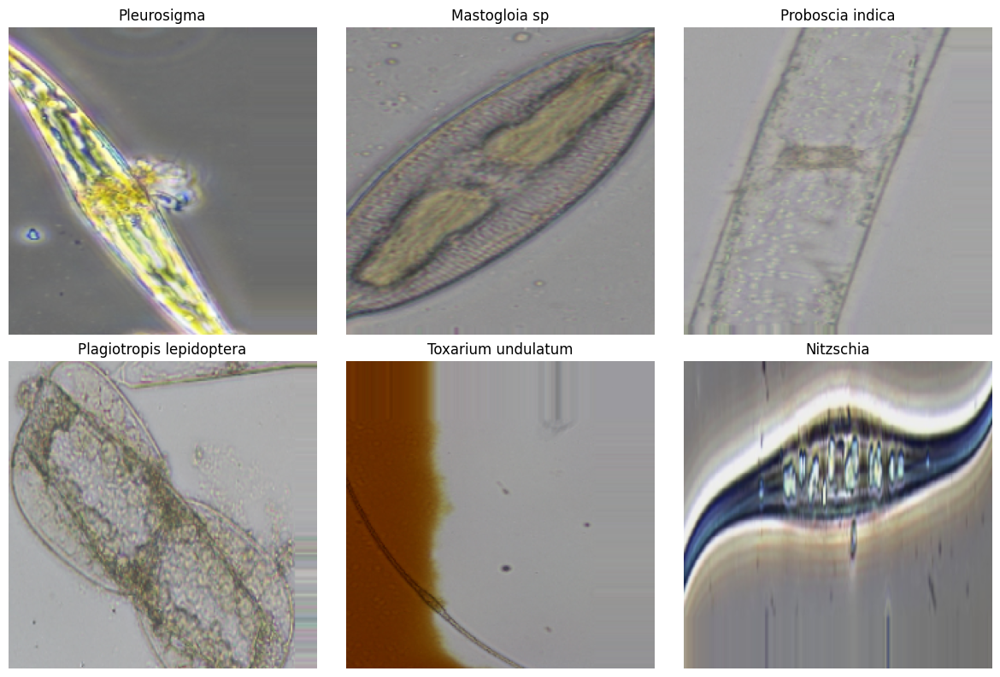

In [18]:
images, labels = next(train_generator)

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))

for i, ax in enumerate(axes.flatten()):
    idx = np.random.randint(0, images.shape[0])
    img = images[idx]
    label = labels[idx]
    
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(dict_labels[np.argmax(label)])

plt.tight_layout()
plt.show()

# **Modelling**

## **Transformers with Pretrained Model**

In [30]:
def build_model(pretrained):
    tfk.backend.clear_session()

    input = tfk.layers.Input(shape=(224, 224, 3))

    x = KerasLayer(
        pretrained,
        trainable=False
    )(input)
    x = tfk.layers.Flatten()(x)
    x = tfk.layers.Dropout(0.2)(x)

    vit = KerasLayer(
        "/kaggle/input/vision-transformer/tensorflow2/vit-s16-classification/1",
        trainable=False
    )(input)
    vit = tfk.layers.Flatten()(vit)
    vit = tfk.layers.Dropout(0.2)(vit)

    concat = tfk.layers.Concatenate()([x, vit])
    output = tfk.layers.Dense(26, activation='softmax')(concat)

    model = tfk.Model(inputs=input, outputs=output)
    
    model.compile(
        optimizer=tfk.optimizers.Adam(
            learning_rate=0.001,
            beta_1=0.9,
            beta_2=0.999,
            epsilon=1e-7,
        ),
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )
    
    return model

In [31]:
def plot_history(history):
    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

    ax[0].set_title('Training Accuracy vs. Epochs')
    ax[0].plot(train_accuracy, 'o-', label='Train Accuracy')
    ax[0].plot(val_accuracy, 'o-', label='Validation Accuracy')
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Accuracy')
    ax[0].legend(loc='best')

    ax[1].set_title('Training/Validation Loss vs. Epochs')
    ax[1].plot(train_loss, 'o-', label='Train Loss')
    ax[1].plot(val_loss, 'o-', label='Validation Loss')
    ax[1].set_xlabel('Epochs')
    ax[1].set_ylabel('Loss')
    ax[1].legend(loc='best')

    plt.tight_layout()
    plt.show()

In [32]:
IMG_WIDTH, IMG_HEIGHT = 224, 224

def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(IMG_WIDTH, IMG_HEIGHT))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array, mode='tf', data_format=None)
    return img, img_array

def predict_image(model):
    base_path = '/kaggle/input/plankton-image/img_cropped'
    
    with open('/kaggle/working/labels.json', 'r') as label_file:
        class_names = json.load(label_file)
    
    selected_images = []
    for class_id, class_name in class_names.items():
        class_path = os.path.join(base_path, class_name)
        if os.path.isdir(class_path):
            img_files = os.listdir(class_path)
            if img_files: 
                img_file = img_files[0]
                img_path = os.path.join(class_path, img_file)
                selected_images.append((class_name, img_path))
            
    max_images = min(len(selected_images), 15)
    fig, axes = plt.subplots(3, 5, figsize=(20, 12))
    axes = axes.flatten()

    for idx in range(max_images):
        actual_class, img_path = selected_images[idx]
        img, img_array = load_and_preprocess_image(img_path)
        predictions = model.predict(img_array)
        predicted_class = np.argmax(predictions, axis=1)[0]
        predicted_class_name = class_names[str(predicted_class)]

        axes[idx].imshow(img)
        axes[idx].axis('off')
        color = 'red' if actual_class != predicted_class_name else 'black'
        axes[idx].set_title(f'Actual: {actual_class}\nPredicted: {predicted_class_name}', color=color)

    for idx in range(max_images, len(axes)):
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

## **BigTransfer**

In [33]:
bit = build_model("/kaggle/input/bit/tensorflow2/m-r101x1/1")
bit.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 2048)                 4249248   ['input_1[0][0]']             
                                                          0                                       
                                                                                                  
 keras_layer_1 (KerasLayer)  (None, 1000)                 2205066   ['input_1[0][0]']             
                                                          4                                       
                                                                                              

In [34]:
bit_history = bit.fit(
    train_generator, epochs=50,
    validation_data=val_generator,
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
)

Epoch 1/34
8/8 [==============================] - 79s 4s/step - loss: 5.5057 - accuracy: 0.2239 - val_loss: 1.9808 - val_accuracy: 0.5700
Epoch 2/34


W0000 00:00:1723701539.048334     243 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


8/8 [==============================] - 22s 3s/step - loss: 1.6606 - accuracy: 0.6217 - val_loss: 0.5274 - val_accuracy: 0.8100
Epoch 3/34
8/8 [==============================] - 21s 3s/step - loss: 0.4228 - accuracy: 0.8696 - val_loss: 0.3567 - val_accuracy: 0.9100
Epoch 4/34
8/8 [==============================] - 22s 3s/step - loss: 0.2990 - accuracy: 0.9087 - val_loss: 0.2620 - val_accuracy: 0.9200
Epoch 5/34
8/8 [==============================] - 21s 3s/step - loss: 0.0962 - accuracy: 0.9630 - val_loss: 0.2677 - val_accuracy: 0.9200
Epoch 6/34
8/8 [==============================] - 21s 3s/step - loss: 0.0589 - accuracy: 0.9783 - val_loss: 0.3120 - val_accuracy: 0.9100
Epoch 7/34
8/8 [==============================] - 22s 3s/step - loss: 0.0411 - accuracy: 0.9913 - val_loss: 0.1323 - val_accuracy: 0.9700
Epoch 8/34
8/8 [==============================] - 22s 3s/step - loss: 0.0208 - accuracy: 0.9978 - val_loss: 0.1152 - val_accuracy: 0.9800
Epoch 15/34
8/8 [============================

In [35]:
score = bit.evaluate(test_generator)
print("Loss: ", score[0])
print("Accuracy: ", score[1])

2/2 [==============================] - 4s 1s/step - loss: 0.0768 - accuracy: 0.9500
Loss:  0.07684379816055298
Accuracy:  0.949999988079071


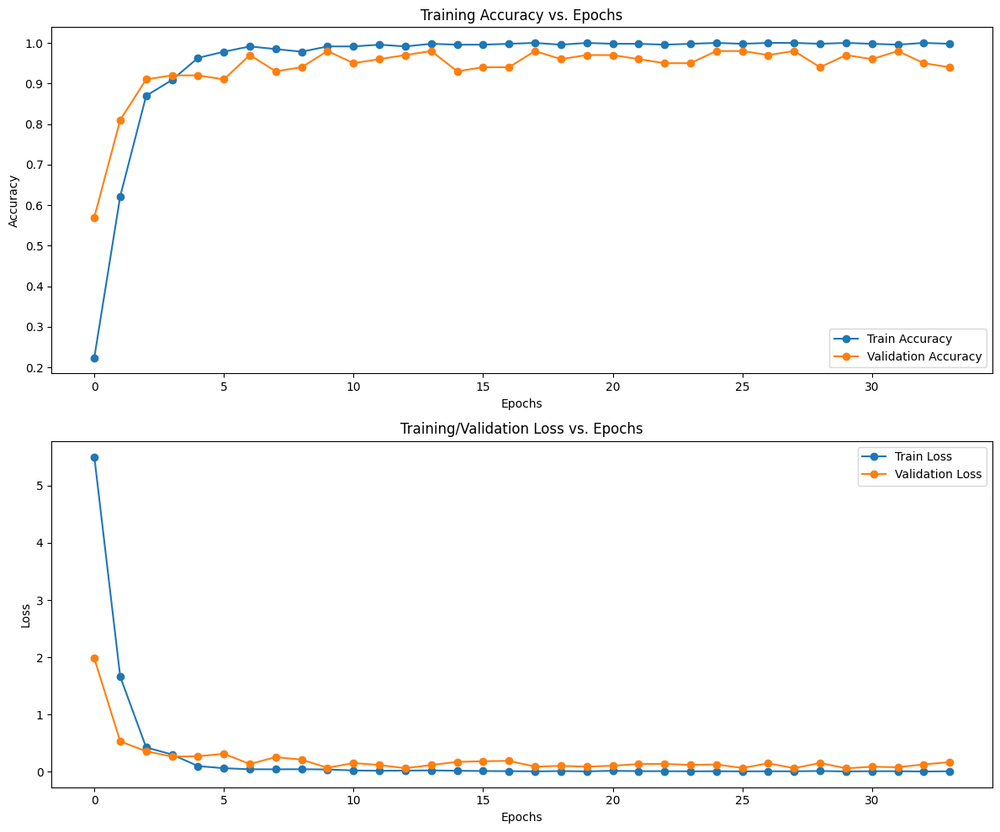

In [36]:
bit.save('bit_model_plankton')
plot_history(bit_history)

1/1 [==============================] - 0s 43ms/step


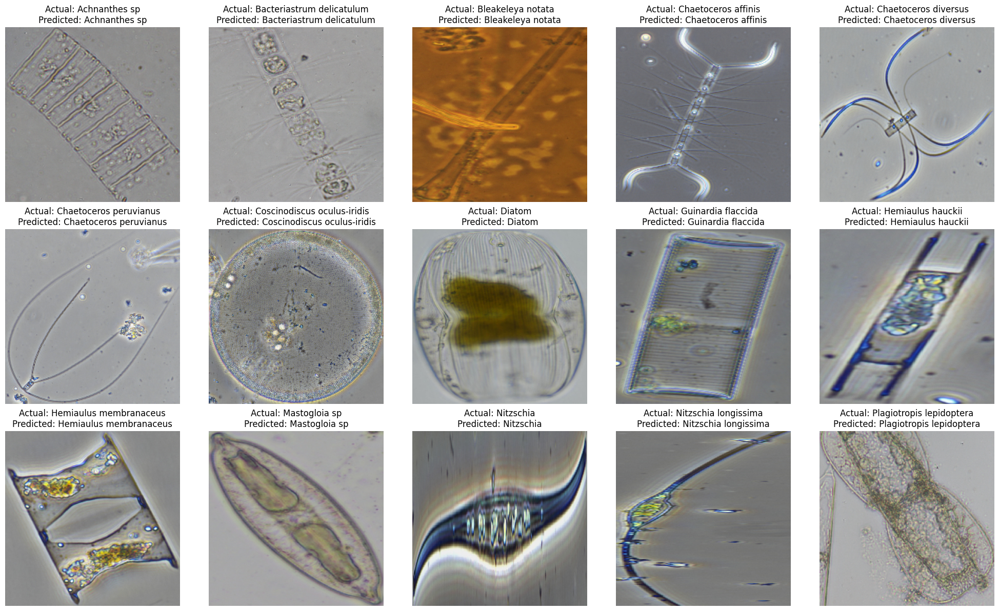

In [37]:
bit = tfk.models.load_model("/kaggle/working/bit_model_plankton")
predict_image(bit)

## **RegNet**

In [8]:
regnet = build_model("/kaggle/input/regnety/tensorflow2/800mf-classification/1")
regnet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 1000)                 6501119   ['input_1[0][0]']             
                                                                                                  
 keras_layer_1 (KerasLayer)  (None, 1000)                 2205066   ['input_1[0][0]']             
                                                          4                                       
                                                                                                  
 flatten (Flatten)           (None, 1000)                 0         ['keras_layer[0][0]']     

In [10]:
regnet_history = regnet.fit(
    train_generator, epochs=50,
    validation_data=val_generator,
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
)

Epoch 1/50


I0000 00:00:1723648470.576480     234 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


8/8 [==============================] - ETA: 0s - loss: 8.5908 - accuracy: 0.0978

W0000 00:00:1723648501.544051     234 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


8/8 [==============================] - 69s 4s/step - loss: 8.5908 - accuracy: 0.0978 - val_loss: 7.7923 - val_accuracy: 0.1400
Epoch 2/50
8/8 [==============================] - 23s 3s/step - loss: 6.3629 - accuracy: 0.1891 - val_loss: 2.7792 - val_accuracy: 0.4300
Epoch 3/50
8/8 [==============================] - 22s 3s/step - loss: 3.6829 - accuracy: 0.3065 - val_loss: 1.7672 - val_accuracy: 0.5000
Epoch 4/50
8/8 [==============================] - 23s 3s/step - loss: 2.2946 - accuracy: 0.4761 - val_loss: 0.7750 - val_accuracy: 0.7600
Epoch 5/50
8/8 [==============================] - 24s 3s/step - loss: 1.6940 - accuracy: 0.5609 - val_loss: 0.5847 - val_accuracy: 0.8400
Epoch 6/50
8/8 [==============================] - 23s 3s/step - loss: 1.3404 - accuracy: 0.6587 - val_loss: 0.4605 - val_accuracy: 0.8500
Epoch 7/50
8/8 [==============================] - 22s 3s/step - loss: 1.0066 - accuracy: 0.7065 - val_loss: 0.2835 - val_accuracy: 0.9200
Epoch 8/50
8/8 [=============================

In [11]:
score = regnet.evaluate(test_generator)
print("Loss: ", score[0])
print("Accuracy: ", score[1])

2/2 [==============================] - 4s 2s/step - loss: 0.0536 - accuracy: 0.9900
Loss:  0.05363147705793381
Accuracy:  0.9900000095367432


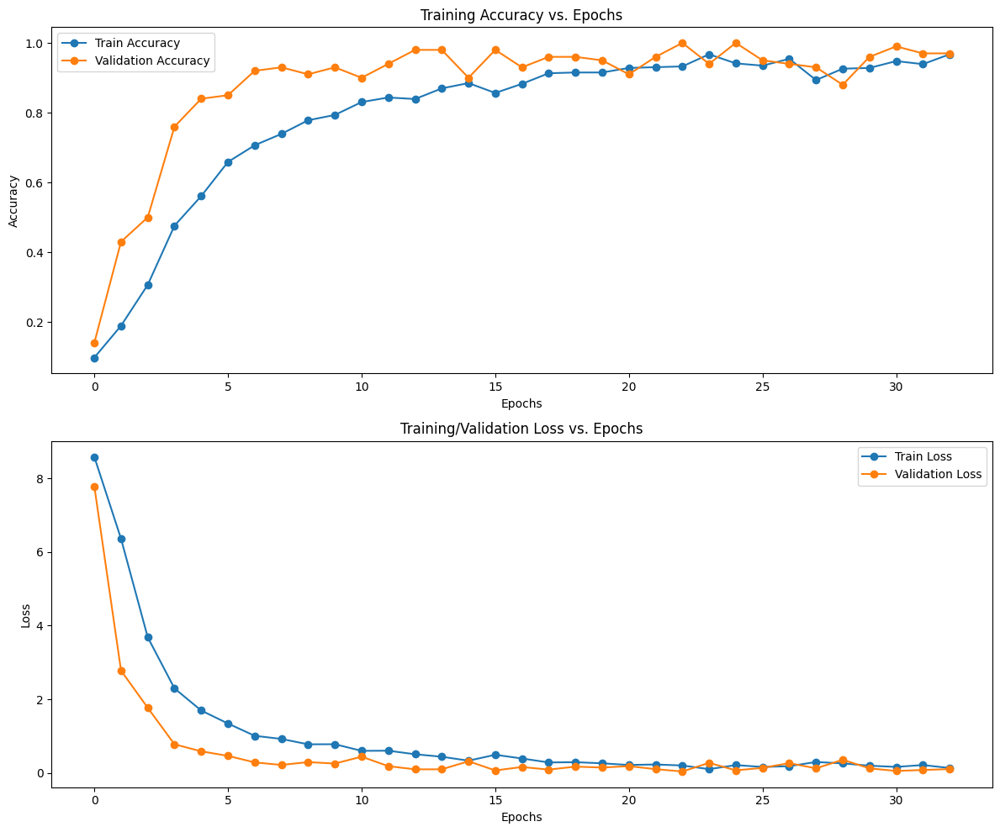

In [15]:
regnet.save('regnet_model_plankton')
plot_history(regnet_history)

1/1 [==============================] - 0s 27ms/step


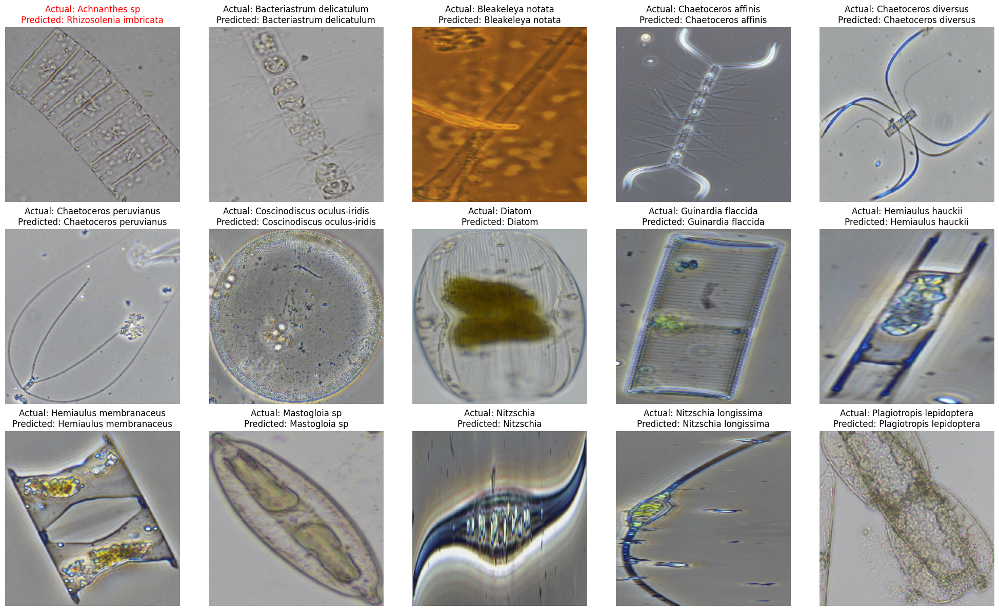

In [26]:
regnet = tfk.models.load_model("/kaggle/working/regnet_model_plankton")
predict_image(regnet)

## **Swin Transformers**

In [19]:
swin = build_model("/kaggle/input/swin/tensorflow2/s3-tiny-224/1")
swin.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 1000)                 2832867   ['input_1[0][0]']             
                                                          4                                       
                                                                                                  
 keras_layer_1 (KerasLayer)  (None, 1000)                 2205066   ['input_1[0][0]']             
                                                          4                                       
                                                                                              

In [20]:
swin_history = swin.fit(
    train_generator, epochs=50,
    validation_data=val_generator,
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
)

Epoch 1/50
8/8 [==============================] - ETA: 0s - loss: 3.6352 - accuracy: 0.1739

W0000 00:00:1723650046.400479     236 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


8/8 [==============================] - 44s 4s/step - loss: 3.6352 - accuracy: 0.1739 - val_loss: 2.1892 - val_accuracy: 0.3100
Epoch 2/50
8/8 [==============================] - 23s 3s/step - loss: 1.6046 - accuracy: 0.5326 - val_loss: 0.7777 - val_accuracy: 0.8300
Epoch 3/50
8/8 [==============================] - 23s 3s/step - loss: 0.7054 - accuracy: 0.8130 - val_loss: 0.3961 - val_accuracy: 0.9300
Epoch 4/50
8/8 [==============================] - 21s 3s/step - loss: 0.3901 - accuracy: 0.8848 - val_loss: 0.3203 - val_accuracy: 0.9100
Epoch 5/50
8/8 [==============================] - 21s 3s/step - loss: 0.2628 - accuracy: 0.9239 - val_loss: 0.2005 - val_accuracy: 0.9400
Epoch 6/50
8/8 [==============================] - 22s 3s/step - loss: 0.1498 - accuracy: 0.9609 - val_loss: 0.1506 - val_accuracy: 0.9600
Epoch 7/50
8/8 [==============================] - 22s 3s/step - loss: 0.1298 - accuracy: 0.9761 - val_loss: 0.1413 - val_accuracy: 0.9800
Epoch 8/50
8/8 [=============================

In [21]:
score = swin.evaluate(test_generator)
print("Loss: ", score[0])
print("Accuracy: ", score[1])

2/2 [==============================] - 4s 1s/step - loss: 0.0480 - accuracy: 1.0000
Loss:  0.047997623682022095
Accuracy:  1.0


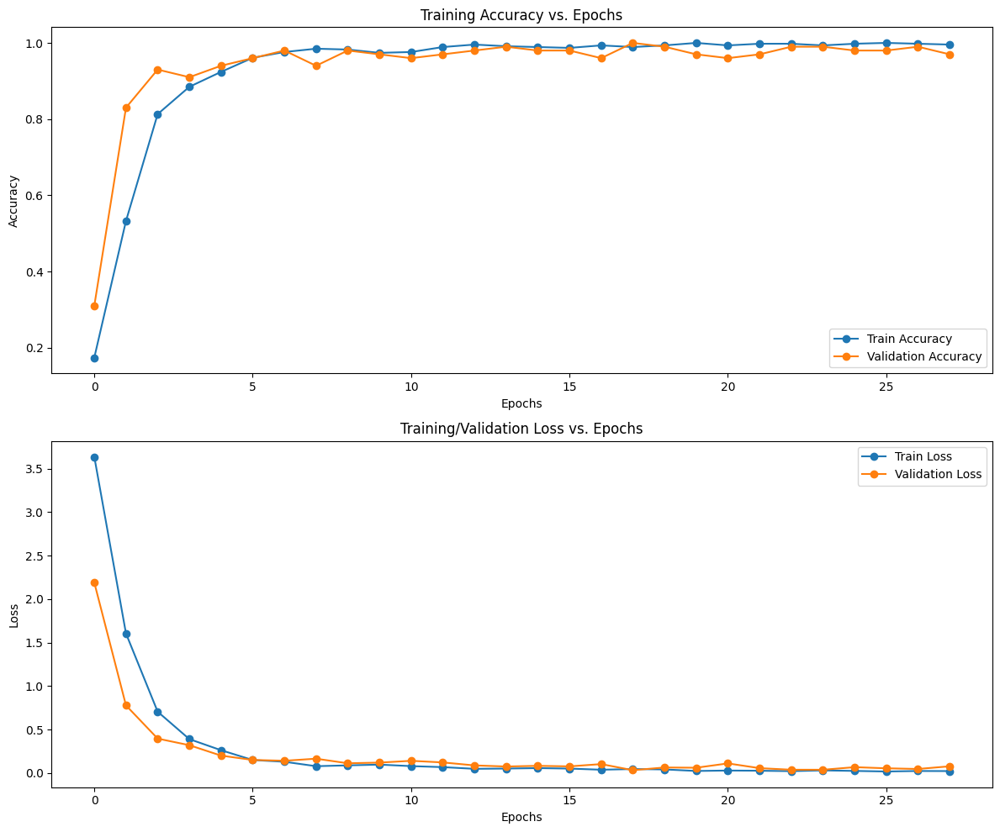

In [27]:
swin.save('swin_model_plankton')
plot_history(swin_history)

1/1 [==============================] - 0s 47ms/step


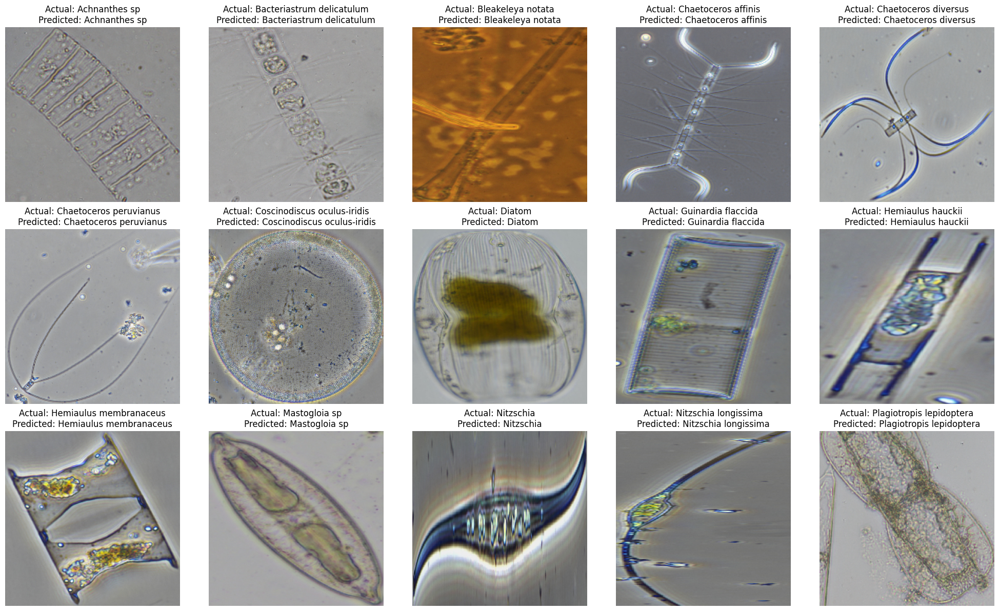

In [27]:
swin = tfk.models.load_model("/kaggle/working/swin_model_plankton")
predict_image(swin)

## **ConvNeXt**

In [23]:
conv = build_model("/kaggle/input/convnext/tensorflow2/tiny-1k-224/1")
conv.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 1000)                 2858912   ['input_1[0][0]']             
                                                          8                                       
                                                                                                  
 keras_layer_1 (KerasLayer)  (None, 1000)                 2205066   ['input_1[0][0]']             
                                                          4                                       
                                                                                              

In [24]:
conv_history = conv.fit(
    train_generator, epochs=50,
    validation_data=val_generator,
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
)

Epoch 1/50
8/8 [==============================] - ETA: 0s - loss: 3.8272 - accuracy: 0.1522

W0000 00:00:1723651267.571710     237 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


8/8 [==============================] - 41s 4s/step - loss: 3.8272 - accuracy: 0.1522 - val_loss: 1.9720 - val_accuracy: 0.4600
Epoch 2/50
8/8 [==============================] - 22s 3s/step - loss: 1.6260 - accuracy: 0.5348 - val_loss: 0.7476 - val_accuracy: 0.8100
Epoch 3/50
8/8 [==============================] - 23s 3s/step - loss: 0.7504 - accuracy: 0.7870 - val_loss: 0.5638 - val_accuracy: 0.8200
Epoch 4/50
8/8 [==============================] - 22s 3s/step - loss: 0.3751 - accuracy: 0.8891 - val_loss: 0.2538 - val_accuracy: 0.9600
Epoch 5/50
8/8 [==============================] - 22s 3s/step - loss: 0.2438 - accuracy: 0.9304 - val_loss: 0.1898 - val_accuracy: 0.9500
Epoch 6/50
8/8 [==============================] - 22s 3s/step - loss: 0.1638 - accuracy: 0.9543 - val_loss: 0.1957 - val_accuracy: 0.9600
Epoch 7/50
8/8 [==============================] - 22s 3s/step - loss: 0.1299 - accuracy: 0.9652 - val_loss: 0.1800 - val_accuracy: 0.9500
Epoch 8/50
8/8 [=============================

In [25]:
score = conv.evaluate(test_generator)
print("Loss: ", score[0])
print("Accuracy: ", score[1])

2/2 [==============================] - 4s 1s/step - loss: 0.0798 - accuracy: 0.9600
Loss:  0.07978781312704086
Accuracy:  0.9599999785423279


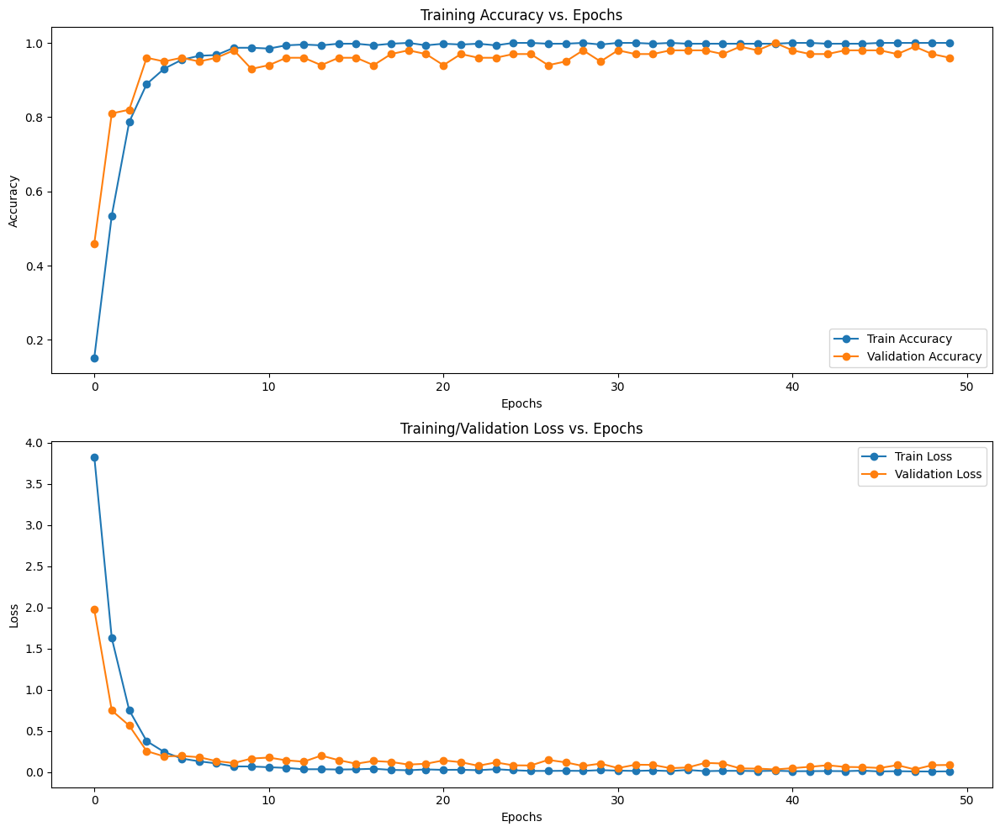

In [26]:
conv.save('conv_model_plankton')
plot_history(conv_history)

1/1 [==============================] - 0s 40ms/step


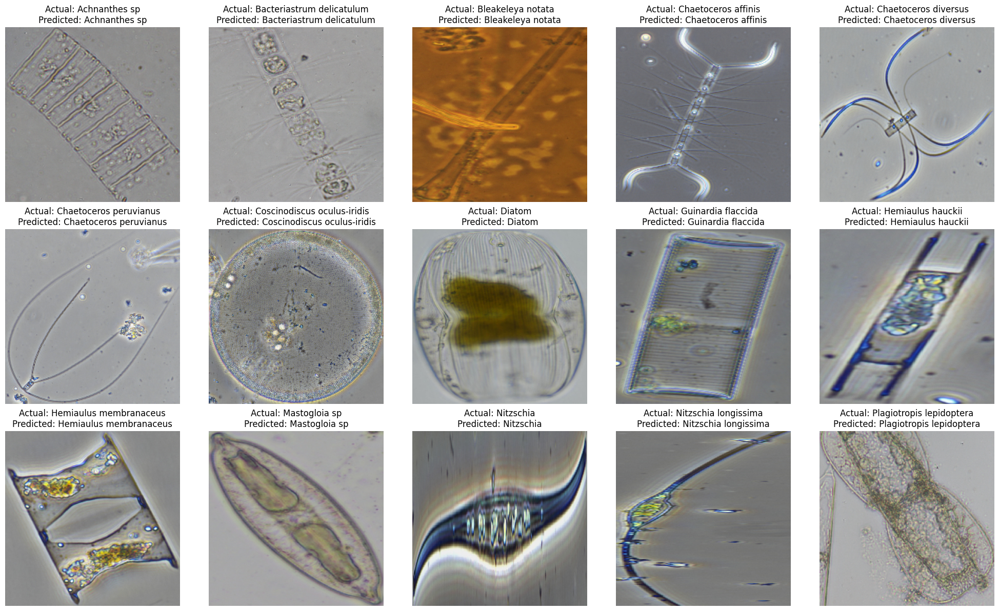

In [28]:
conv = tfk.models.load_model("/kaggle/working/conv_model_plankton")
predict_image(conv)

## **Vision Transformers**

In [50]:
vit = build_model("/kaggle/input/vision-transformer/tensorflow2/vit-r26-s32-medaug-fe/1")
vit.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 384)                  3604691   ['input_1[0][0]']             
                                                          2                                       
                                                                                                  
 keras_layer_1 (KerasLayer)  (None, 1000)                 2205066   ['input_1[0][0]']             
                                                          4                                       
                                                                                              

In [51]:
vit_history = vit.fit(
    train_generator, epochs=50,
    validation_data=val_generator,
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
)

Epoch 1/50
8/8 [==============================] - ETA: 0s - loss: 5.5440 - accuracy: 0.1457

W0000 00:00:1723655455.456765     235 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1723655466.760330     237 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


8/8 [==============================] - 80s 8s/step - loss: 5.5440 - accuracy: 0.1457 - val_loss: 2.7595 - val_accuracy: 0.3800
Epoch 2/50
8/8 [==============================] - 21s 3s/step - loss: 2.3870 - accuracy: 0.4848 - val_loss: 0.9743 - val_accuracy: 0.7800
Epoch 3/50
8/8 [==============================] - 21s 3s/step - loss: 1.0172 - accuracy: 0.7304 - val_loss: 0.3441 - val_accuracy: 0.9000
Epoch 4/50
8/8 [==============================] - 21s 3s/step - loss: 0.3805 - accuracy: 0.8848 - val_loss: 0.2590 - val_accuracy: 0.9300
Epoch 5/50
8/8 [==============================] - 23s 3s/step - loss: 0.3044 - accuracy: 0.9065 - val_loss: 0.2169 - val_accuracy: 0.9600
Epoch 6/50
8/8 [==============================] - 21s 3s/step - loss: 0.1776 - accuracy: 0.9500 - val_loss: 0.1181 - val_accuracy: 0.9600
Epoch 7/50
8/8 [==============================] - 21s 3s/step - loss: 0.1372 - accuracy: 0.9500 - val_loss: 0.1463 - val_accuracy: 0.9500
Epoch 8/50
8/8 [=============================

In [52]:
score = vit.evaluate(test_generator)
print("Loss: ", score[0])
print("Accuracy: ", score[1])

2/2 [==============================] - 4s 1s/step - loss: 0.0714 - accuracy: 0.9700
Loss:  0.07140786200761795
Accuracy:  0.9700000286102295


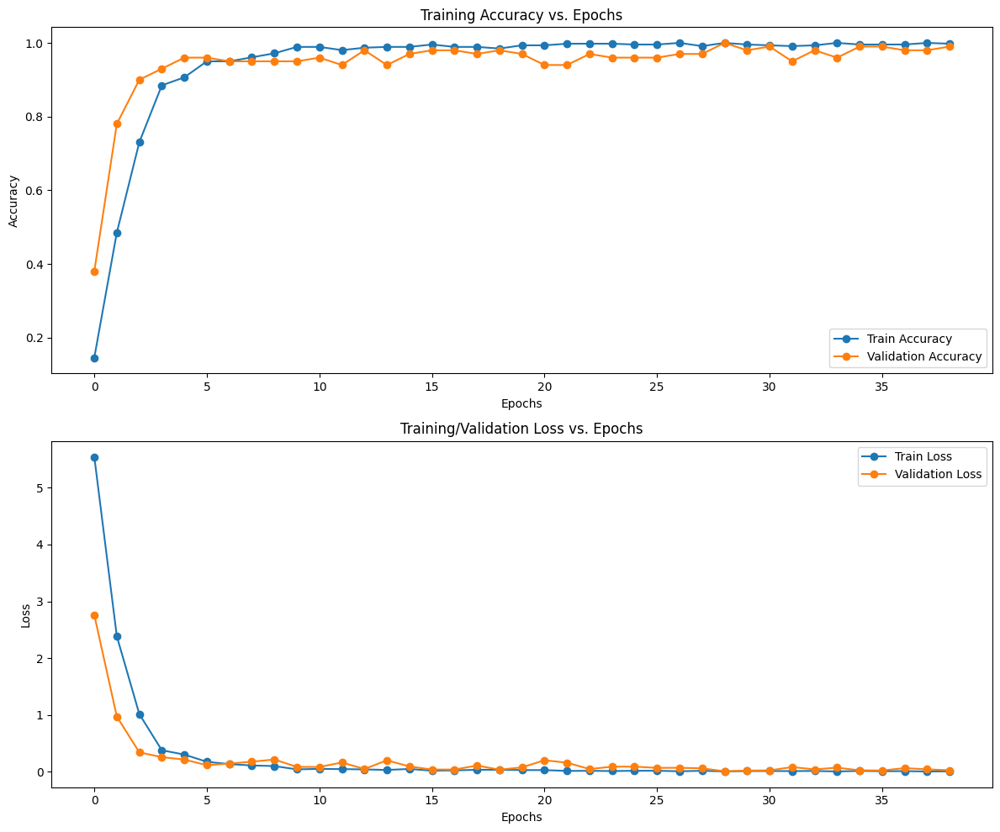

In [53]:
vit.save('vit_model_plankton')
plot_history(vit_history)

1/1 [==============================] - 0s 24ms/step


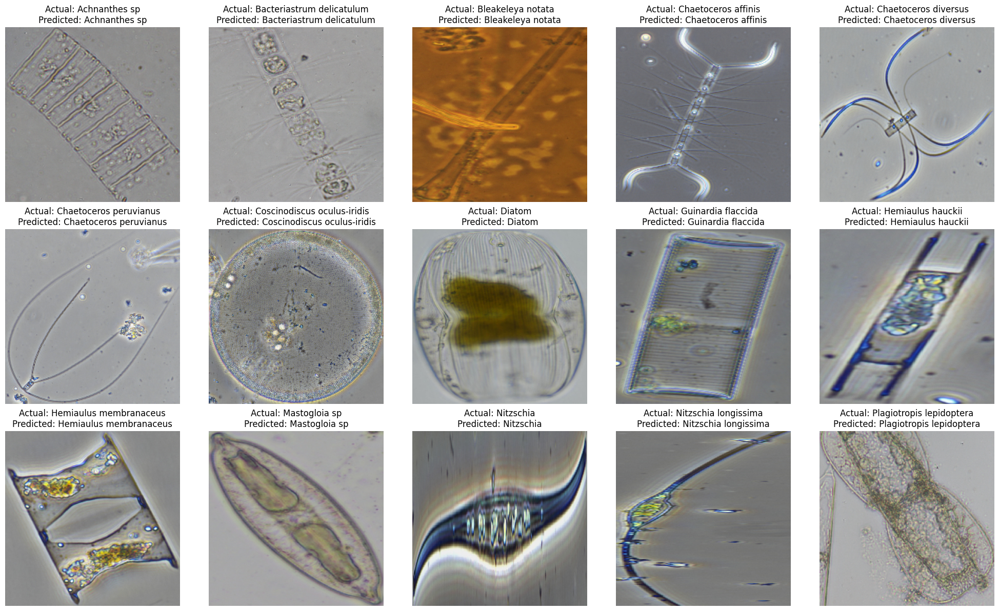

In [29]:
vit = tfk.models.load_model("/kaggle/working/vit_model_plankton")
predict_image(vit)

# **Testing**

I0000 00:00:1723951590.444739     204 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 [==============================] - 15s 15s/step


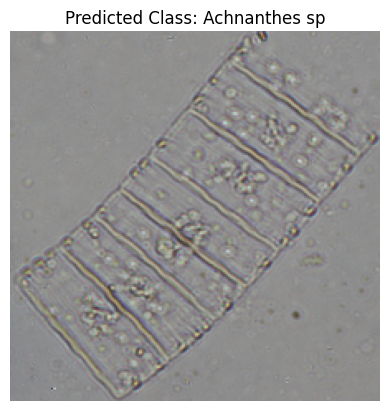

In [4]:
def load_model(model):
    if model == "vit":
        l_model = tfk.models.load_model('/kaggle/working/vit_model_plankton')
    elif model == "bit":
        l_model = tfk.models.load_model('/kaggle/working/bit_model_plankton')
    elif model == "swin":
        l_model = tfk.models.load_model('/kaggle/working/bit_model_plankton')
    elif model == "conv":
        l_model = tfk.models.load_model('/kaggle/working/bit_model_plankton')
    else:
        l_model = tfk.models.load_model('/kaggle/working/regnet_model_plankton')
    return l_model

with open('labels.json', 'r') as label_file:
    class_names = json.load(label_file)

IMG_WIDTH, IMG_HEIGHT = 224, 224
    
img_path = '/kaggle/input/fitoplankton-testing-dataset/testing/Achnanthes sp/Achnanthes sp_1.jpg'

img = image.load_img(img_path, target_size=(IMG_WIDTH, IMG_HEIGHT))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array, mode='tf', data_format=None)

predicted_class = np.argmax(load_model("swin").predict(img_array), axis=1)[0]

plt.imshow(img)
plt.title(f'Predicted Class: {class_names[str(predicted_class)]}')
plt.axis('off')
plt.show()